In [60]:
import pandas as pd
import seaborn as sns
from sklearn.preprocessing import LabelEncoder

In [61]:
payslips = pd.read_csv("payslips.csv")

In [62]:
df_shape = payslips.shape
n_of_transactions = df_shape[0]
n_of_products = df_shape[1]

records = []
for i in range(0, n_of_transactions):
    records.append([])
    for j in range(0, n_of_products):
        if (str(payslips.values[i, j]) != 'nan'):
            records[i].append(int(payslips.values[i, j]))

In [63]:
records_df = pd.DataFrame(records)
print(records_df)

      0    1    2    3    4    5    6    7    8    9
0     7  5.0  2.0  NaN  NaN  NaN  NaN  NaN  NaN  NaN
1     7  5.0  9.0  5.0  6.0  1.0  8.0  NaN  NaN  NaN
2     1  4.0  2.0  9.0  4.0  6.0  5.0  7.0  5.0  9.0
3     5  9.0  7.0  6.0  8.0  1.0  4.0  5.0  2.0  5.0
4     9  3.0  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
...  ..  ...  ...  ...  ...  ...  ...  ...  ...  ...
9995  1  4.0  8.0  NaN  NaN  NaN  NaN  NaN  NaN  NaN
9996  8  6.0  7.0  NaN  NaN  NaN  NaN  NaN  NaN  NaN
9997  8  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
9998  4  2.0  9.0  NaN  NaN  NaN  NaN  NaN  NaN  NaN
9999  2  3.0  1.0  6.0  1.0  6.0  1.0  7.0  NaN  NaN

[10000 rows x 10 columns]


In [65]:
# turn float and int into Int64 (so that the values are integers and nan values are respected (not possible with int64))
float_col = records_df.select_dtypes(include=['float64', 'int64'])

for col in float_col.columns.values:
    records_df[col] = records_df[col].astype('Int64')
print(records_df.dtypes)

0    Int64
1    Int64
2    Int64
3    Int64
4    Int64
5    Int64
6    Int64
7    Int64
8    Int64
9    Int64
dtype: object


In [66]:
# turn Int64 values into strings, so that they can be read
float_col = records_df.select_dtypes(include=['int64'])

for col in float_col.columns.values:
    records_df[col] = records_df[col].astype('string')
print(records_df.dtypes)

0    string
1    string
2    string
3    string
4    string
5    string
6    string
7    string
8    string
9    string
dtype: object


In [67]:
dff = pd.DataFrame()
dff['1']=(records_df == '1').T.sum()
dff['2']=(records_df == '2').T.sum()
dff['3']=(records_df == '3').T.sum()
dff['4']=(records_df == '4').T.sum()
dff['5']=(records_df == '5').T.sum()
dff['6']=(records_df == '6').T.sum()
dff['7']=(records_df == '7').T.sum()
dff['8']=(records_df == '8').T.sum()
dff['9']=(records_df == '9').T.sum()

print(dff)

      1  2  3  4  5  6  7  8  9
0     0  1  0  0  1  0  1  0  0
1     1  0  0  0  2  1  1  1  1
2     1  1  0  2  2  1  1  0  2
3     1  1  0  1  3  1  1  1  1
4     0  0  1  0  0  0  0  0  1
...  .. .. .. .. .. .. .. .. ..
9995  1  0  0  1  0  0  0  1  0
9996  0  0  0  0  0  1  1  1  0
9997  0  0  0  0  0  0  0  1  0
9998  0  1  0  1  0  0  0  0  1
9999  3  1  1  0  0  2  1  0  0

[10000 rows x 9 columns]


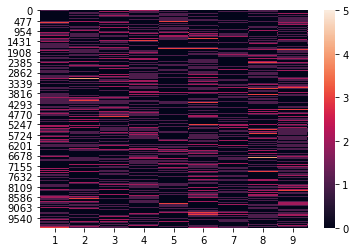

In [69]:
sns.heatmap(dff)

In [72]:
correlation_matrix = dff.corr()
print(correlation_matrix)

          1         2         3         4         5         6         7  \
1  1.000000  0.174317  0.170046  0.100848 -0.031855  0.070589 -0.039035   
2  0.174317  1.000000  0.249665  0.105862 -0.047091  0.057621 -0.049976   
3  0.170046  0.249665  1.000000  0.083479 -0.043108  0.053468 -0.029798   
4  0.100848  0.105862  0.083479  1.000000 -0.050282  0.136774 -0.027596   
5 -0.031855 -0.047091 -0.043108 -0.050282  1.000000  0.138788  0.261247   
6  0.070589  0.057621  0.053468  0.136774  0.138788  1.000000  0.155110   
7 -0.039035 -0.049976 -0.029798 -0.027596  0.261247  0.155110  1.000000   
8  0.102209  0.099292  0.097783  0.250890 -0.015987  0.134118 -0.020945   
9  0.080174  0.057742  0.084840  0.084534  0.141537  0.132982  0.142481   

          8         9  
1  0.102209  0.080174  
2  0.099292  0.057742  
3  0.097783  0.084840  
4  0.250890  0.084534  
5 -0.015987  0.141537  
6  0.134118  0.132982  
7 -0.020945  0.142481  
8  1.000000  0.083753  
9  0.083753  1.000000  


[Text(0, 0.5, 'Hammer'),
 Text(0, 1.5, 'Brett'),
 Text(0, 2.5, 'Nagel'),
 Text(0, 3.5, 'Pinsel'),
 Text(0, 4.5, 'Frostschutz'),
 Text(0, 5.5, 'Klebeband'),
 Text(0, 6.5, 'Gartenschlauch'),
 Text(0, 7.5, 'Farbe'),
 Text(0, 8.5, 'Maßband')]

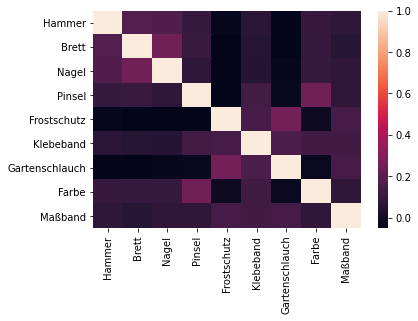

In [82]:
correlation_heatmap = sns.heatmap(correlation_matrix)
correlation_heatmap.set_xticklabels(["Hammer", "Brett", "Nagel", "Pinsel", "Frostschutz", "Klebeband", "Gartenschlauch", "Farbe", "Maßband"], rotation=90)
correlation_heatmap.set_yticklabels(["Hammer", "Brett", "Nagel", "Pinsel", "Frostschutz", "Klebeband", "Gartenschlauch", "Farbe", "Maßband"], rotation=0)